In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

# import library, package, dan dataset
from keras import utils
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

from astroNN.models import Galaxy10CNN
from astroNN.datasets import galaxy10
from astroNN.datasets.galaxy10 import galaxy10cls_lookup, galaxy10_confusion


In [2]:
#Download dan load dataset Galaxy10
images, labels = galaxy10.load_data()

# Convert label menjadi 10 kelas kategorikal
labels = utils.to_categorical(labels, 10)

/root/.astroNN/datasets/Galaxy10_DECals.h5 was found!


===================Data Inspection===================


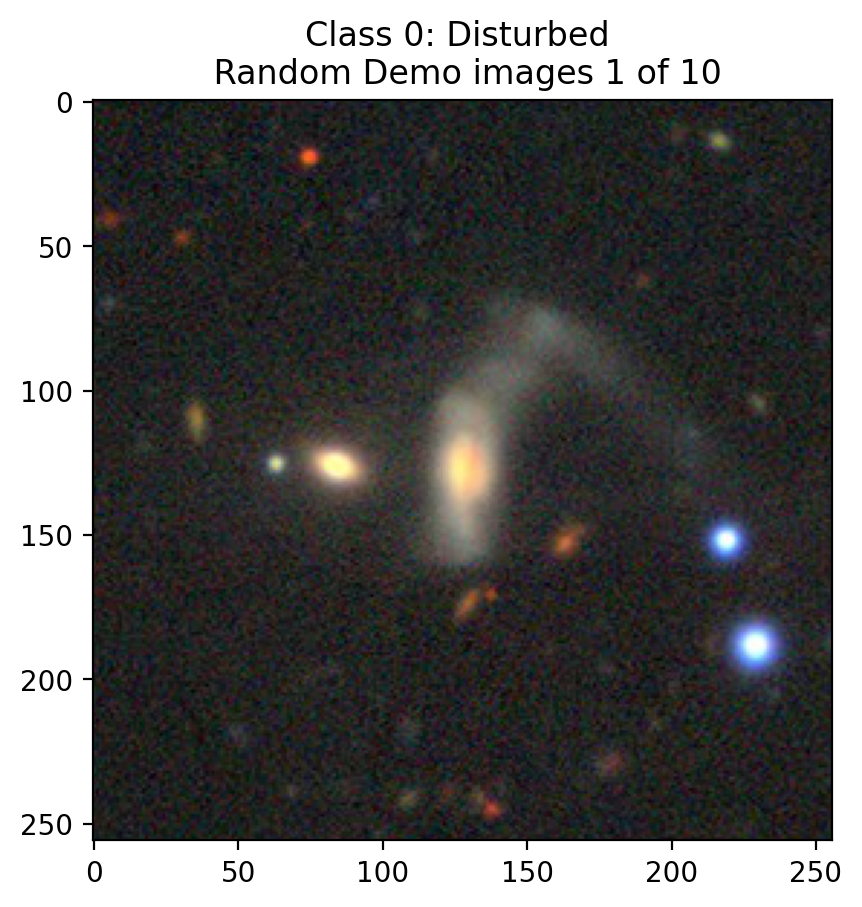

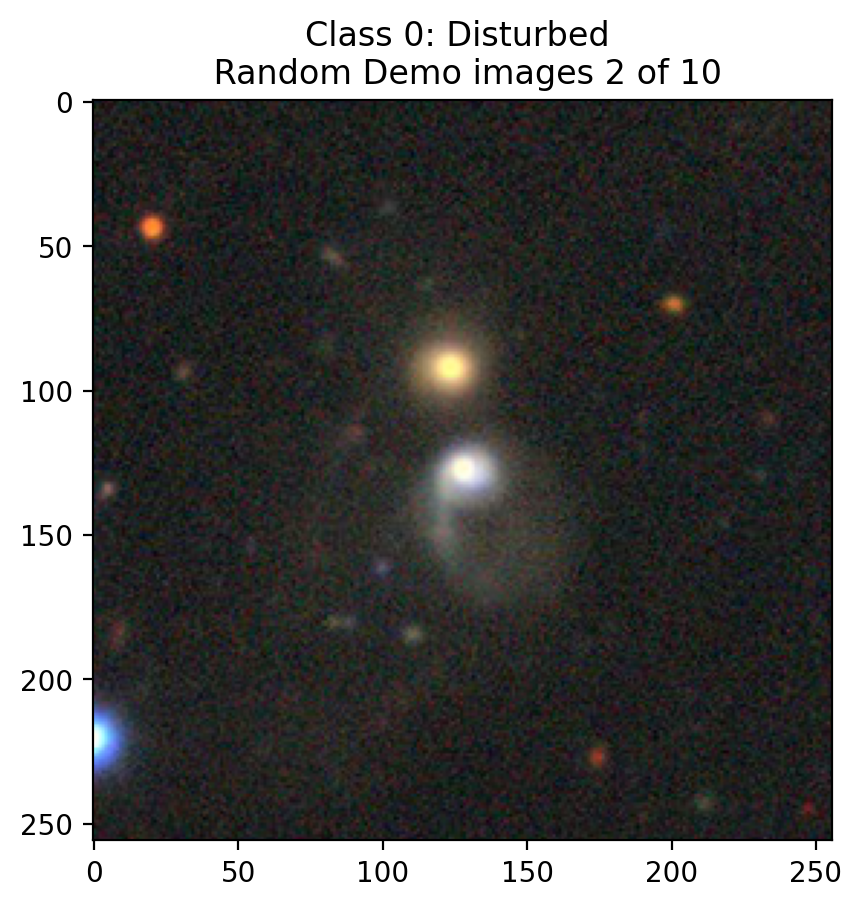

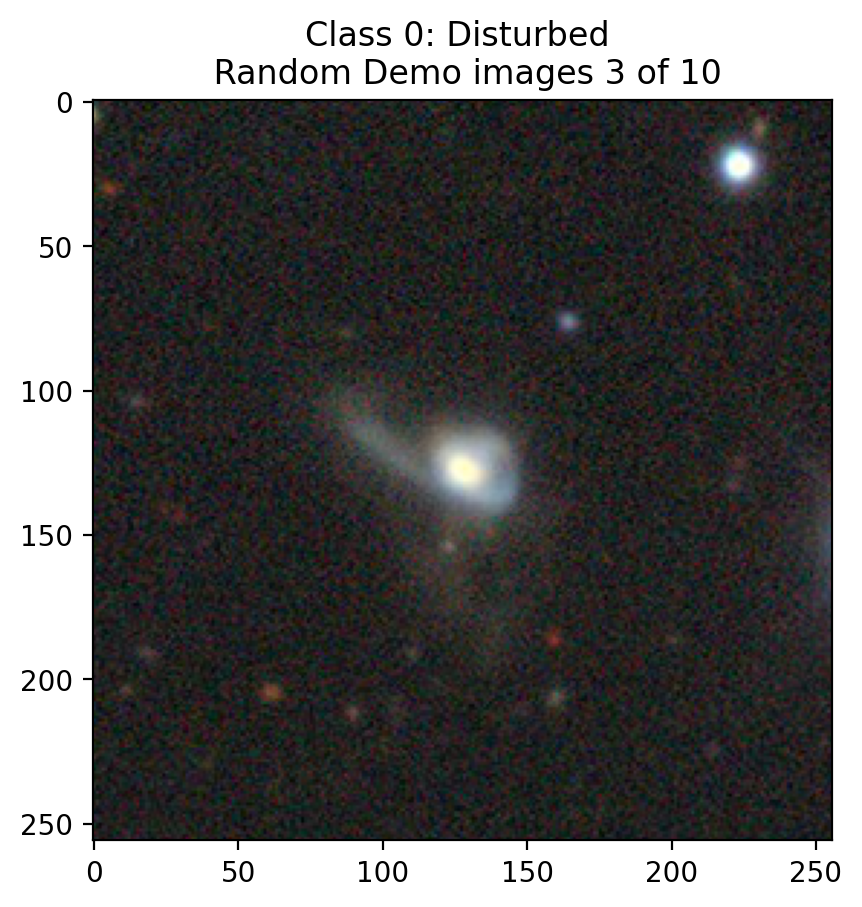

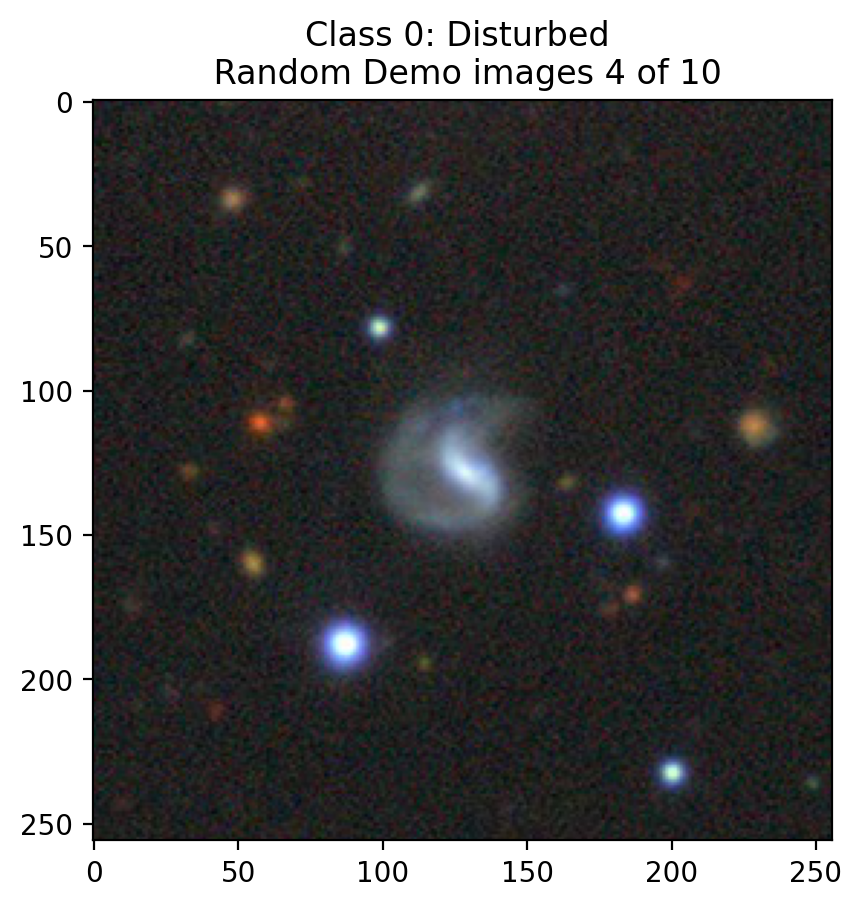

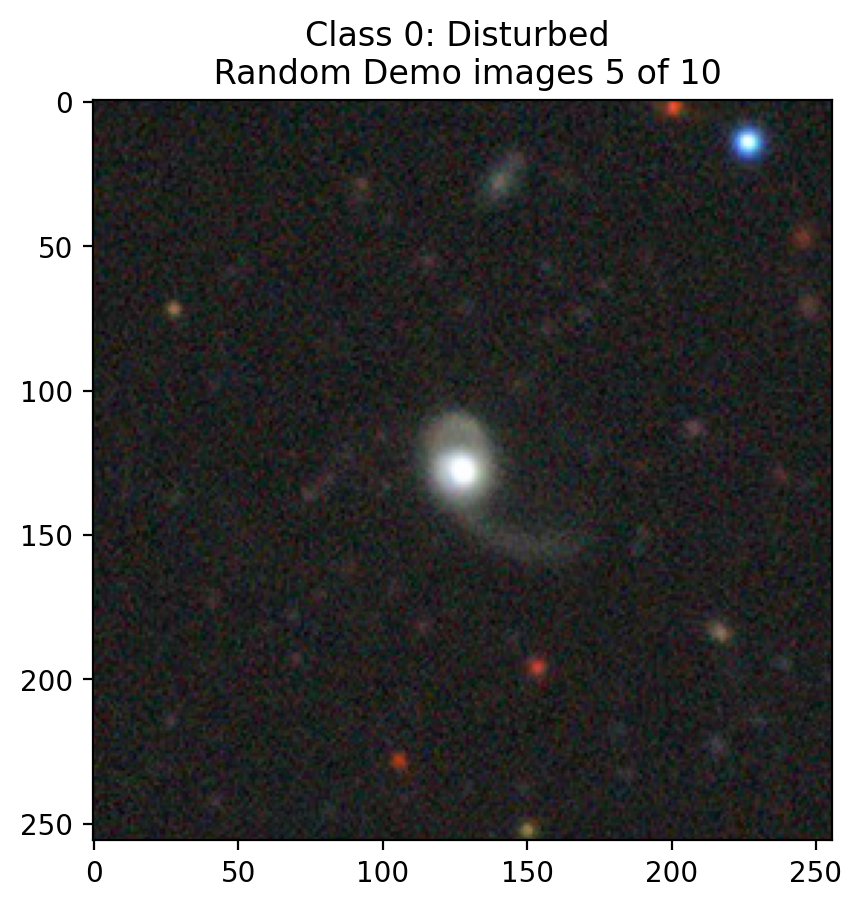

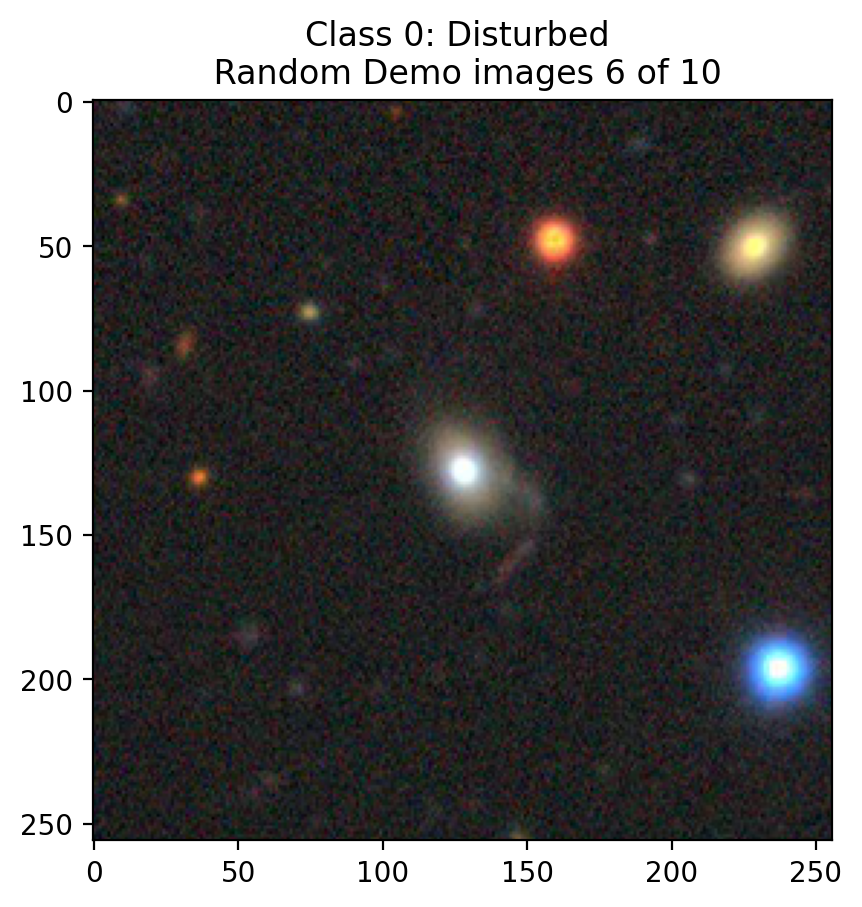

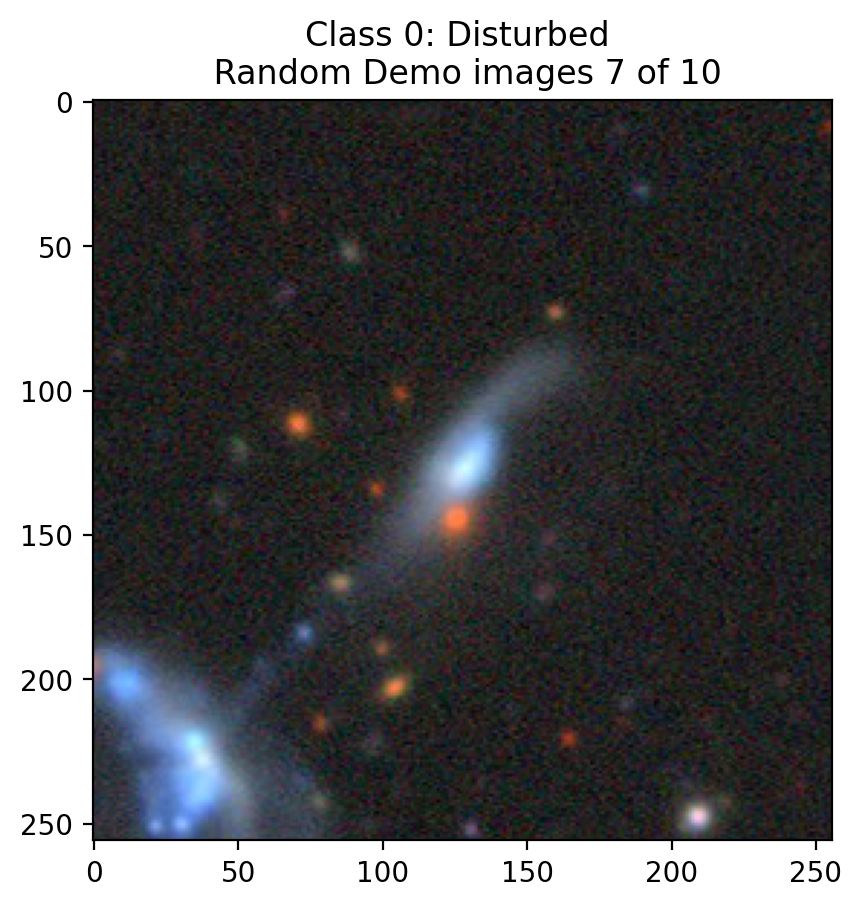

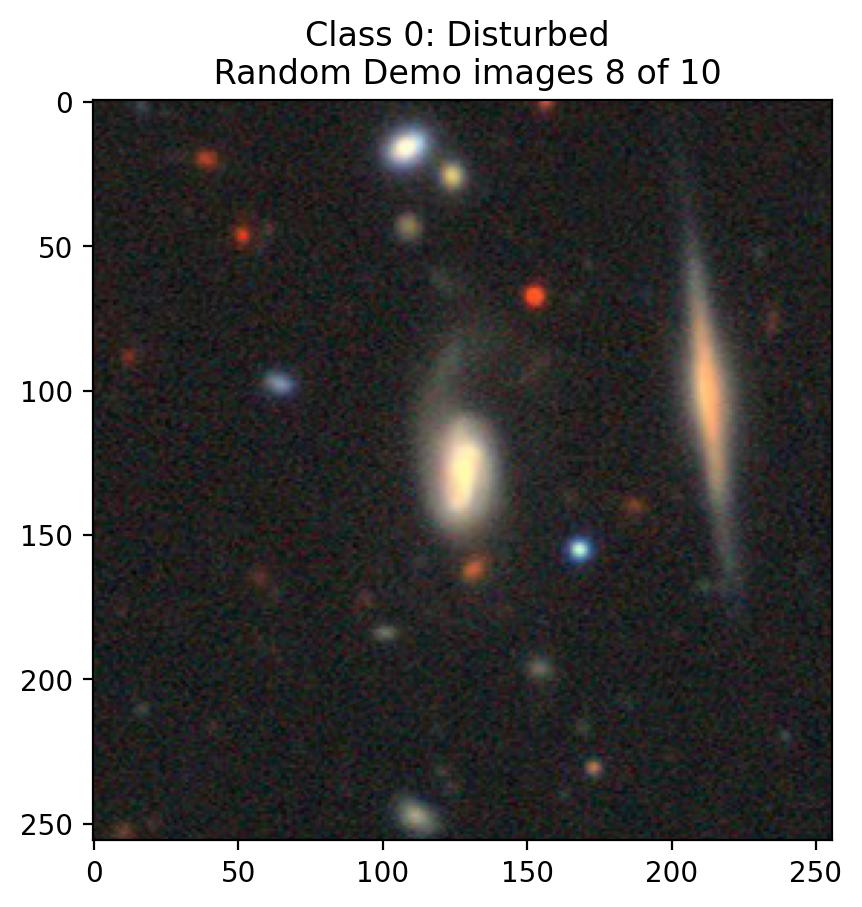

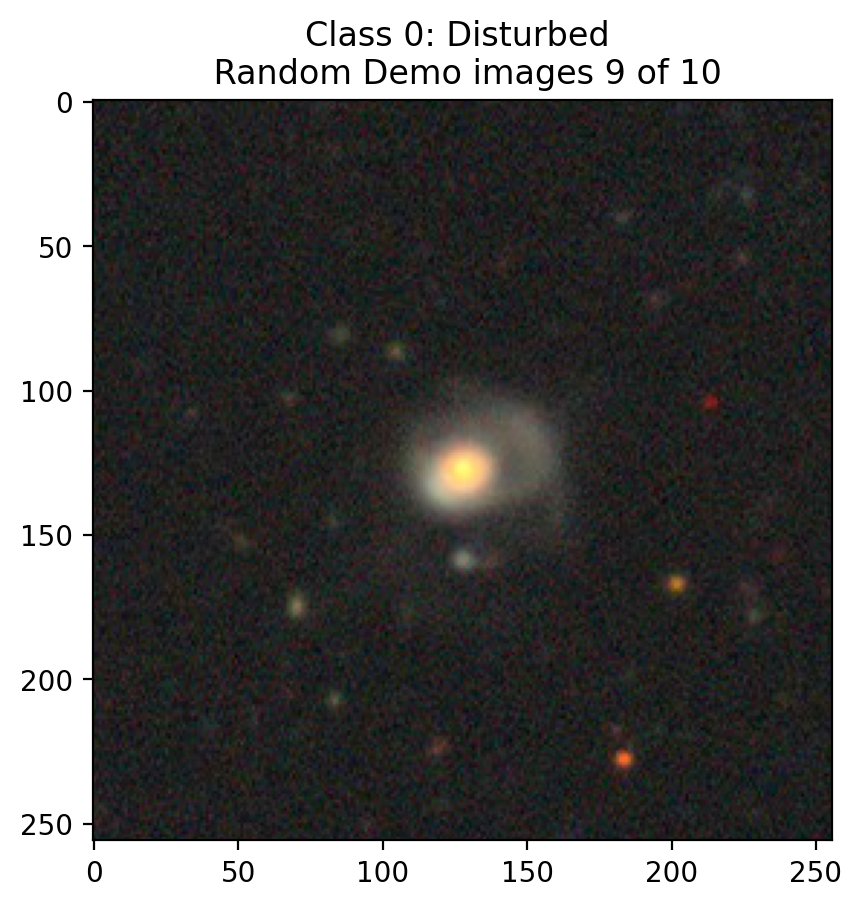

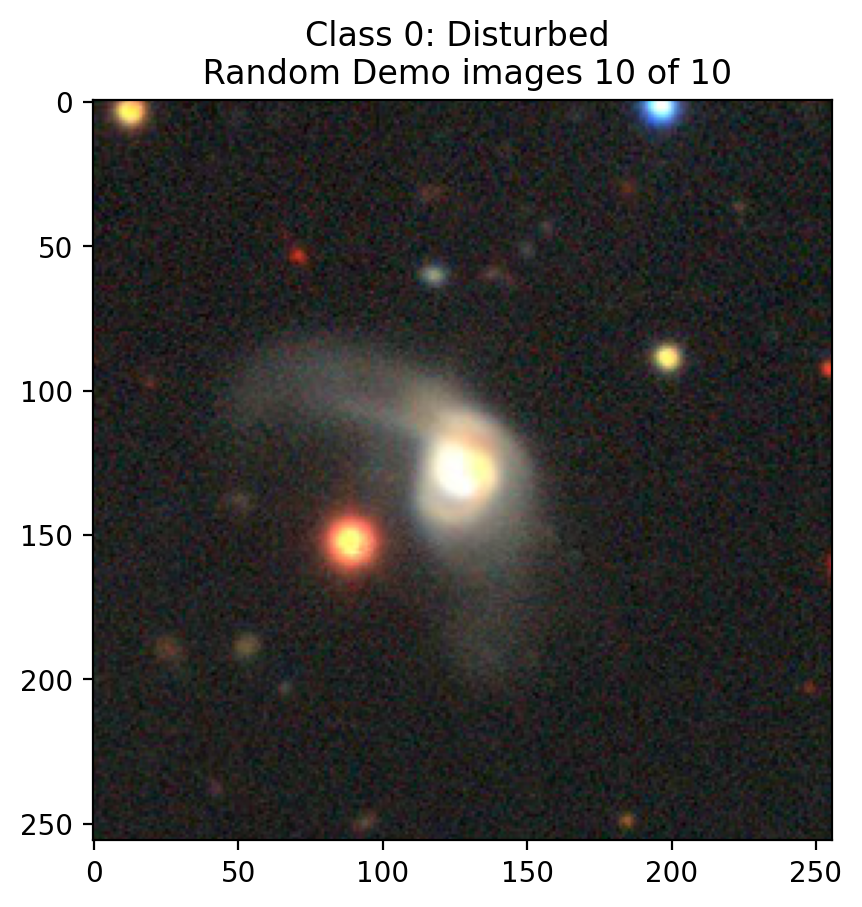

===============Data Inspection Finished===============


In [3]:
# Select 10 of the images to inspect
img = None
plt.ion() #Mode real-time untuk memperbarui plot secara real-time
print("===================Data Inspection===================")
for counter, i in enumerate(
    range(np.random.randint(0, labels.shape[0], size=10).shape[0])
):
    img = plt.imshow(images[i])
    plt.title(
        f"Class {np.argmax(labels[i])}: {galaxy10cls_lookup(labels[i])} \n Random Demo images {counter+1} of 10"
    )
    plt.draw()
    plt.pause(2.0) #Refresh plot dan generate yang baru setelah 2 detik delay
plt.close("all")
print("===============Data Inspection Finished===============")

In [4]:
#Mengubah tipe data labels dan images menjadi float32 (sesuai dengan training)
labels = labels.astype(np.float32)
images = images.astype(np.float32)

In [5]:
# Split training set dan test set
train_idx, test_idx = train_test_split(np.arange(labels.shape[0]), test_size=0.1)
train_images, train_labels, test_images, test_labels = (
    images[train_idx],
    labels[train_idx],
    images[test_idx],
    labels[test_idx],
)

In [15]:
pip install tensorflow==<2.18>

/bin/bash: -c: line 1: syntax error near unexpected token `newline'
/bin/bash: -c: line 1: `pip install tensorflow==<2.18>'


In [16]:
pip install keras==<2.18>

/bin/bash: -c: line 1: syntax error near unexpected token `newline'
/bin/bash: -c: line 1: `pip install keras==<2.18>'


In [19]:
# Manual compilation and training
galaxy10net.keras_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model using fit
galaxy10net.keras_model.fit(train_images, train_labels, epochs=1, batch_size=32)
#Menggunakan epoch 1 karena terdapat error RAM penuh saat mencapai epoch 3

499/499 ━━━━━━━━━━━━━━━━━━━━ 1057s 2s/step - accuracy: 0.1303 - loss: 13.3654


In [21]:
# Menampilkan ringkasan model
galaxy10net.keras_model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 256, 256, 8)    │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_16 (Activation)      │ (None, 256, 256, 8)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 256, 256, 16)   │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_17 (Activation)      │ (None, 256, 256, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │    16,777,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_18 (Activation)      │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_19 (Activation)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 10)             │         1,290 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Activation)             │ (None, 10)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 50,439,152 (192.41 MB)

 Trainable params: 16,813,050 (64.14 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 33,626,102 (128.27 MB)

In [23]:
#Menguji model menggunakan data pengujian untuk menghasilkan label prediksi.
predicted_labels = galaxy10net.keras_model.predict(test_images)

#Konversi label menjadi kelas kategori
prediction_class = np.argmax(predicted_labels, axis=1)

#Mengestimasi nilai tertinggi yang digunakan prediksi dan konversi ke kelas
test_class = np.argmax(test_labels, axis=1)

56/56 ━━━━━━━━━━━━━━━━━━━━ 22s 395ms/step


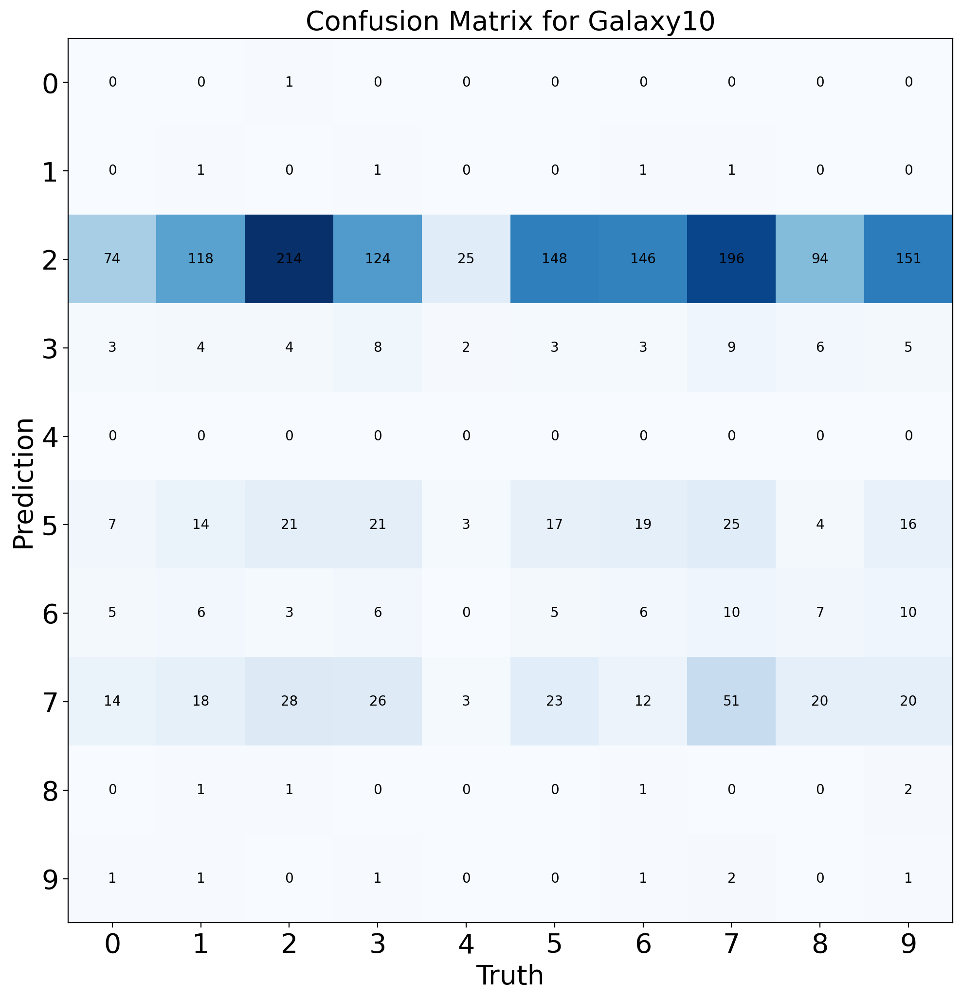

In [24]:
confusion_matrix = np.zeros((10, 10))

for counter, i in enumerate(prediction_class):
    confusion_matrix[i, test_class[counter]] += 1

# Visualisasikan conf.matrix
galaxy10_confusion(confusion_matrix)